In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sqlalchemy import create_engine
import seaborn as sns
from sklearn.model_selection import GridSearchCV
import time
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor



In [2]:
# Create an engine for the sqlite database
engine = create_engine("sqlite:///db.sqlite", echo=False)

# Connect with database
connection = engine.connect()

# create dataframe from sql database
house_prices_df = pd.read_sql("select * from house_prices", con=connection)
house_prices_df.head()

,index,id,price,date,address,suburb,bedrooms,bathrooms,land_area,latitude,longitude
0,0,1,565000,1535760000,1 Acorn Place,South Lake,4,2,600,-32.115900,115.842450
1,1,2,365000,1548979200,1 Addis Way,Wandi,3,2,351,-32.193470,115.859553
2,2,3,287000,1433116800,1 Ainsley Court,Camillo,3,1,719,-32.120578,115.993579
3,3,4,255000,1530403200,1 Albert Street,Bellevue,2,1,651,-31.900547,116.038009
4,4,5,325000,1477958400,1 Aman Place,Lockridge,4,1,466,-31.885790,115.947780


In [3]:
X = house_prices_df[["price","bedrooms","bathrooms","land_area"]]
y = house_prices_df["date"].values.reshape(-1, 1)
print(X.shape, y.shape)

(33656, 4) (33656, 1)


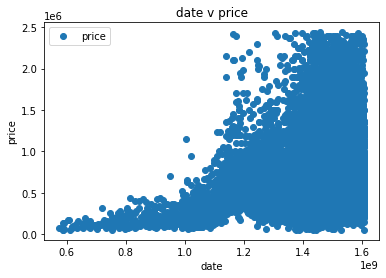

In [4]:
house_prices_df.plot(x='date', y='price', style='o')
plt.title('date v price')
plt.xlabel('date')
plt.ylabel('price')
plt.show()

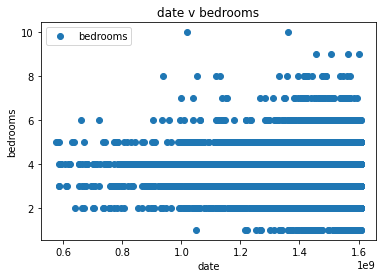

In [5]:
house_prices_df.plot(x='date', y='bedrooms', style='o')
plt.title('date v bedrooms')
plt.xlabel('date')
plt.ylabel('bedrooms')
plt.show()

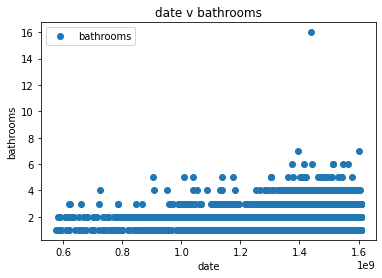

In [6]:
house_prices_df.plot(x='date', y='bathrooms', style='o')
plt.title('date v bathrooms')
plt.xlabel('date')
plt.ylabel('bathrooms')
plt.show()

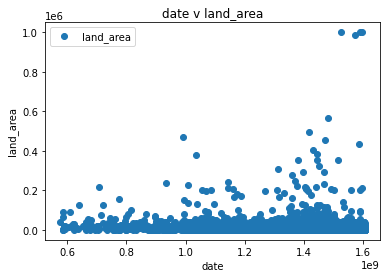

In [7]:
house_prices_df.plot(x='date', y='land_area', style='o')
plt.title('date v land_area')
plt.xlabel('date')
plt.ylabel('land_area')
plt.show()

<AxesSubplot:>

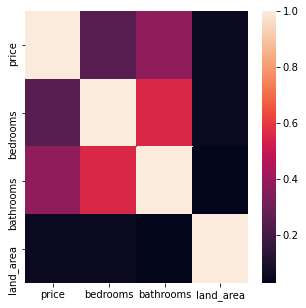

In [8]:
plt.figure(figsize=(5,5))
sns.heatmap(X.corr())

In [9]:
# Split training data into features (x_train) and labels (Y_train)
x_train = house_prices_df.drop(columns=["index","id","address","suburb","latitude","longitude","date"])
Y_train = house_prices_df["date"]

In [10]:
def model_pipeline(model, param_grid, scoring):
    Tuned_Model = GridSearchCV(
        estimator=model, param_grid=param_grid, scoring=scoring, cv=5
    )

    # Fit model & Time the process for training the model
    print("running model")
    start_time = time.process_time()

    Tuned_Model.fit(x_train, Y_train)

    # End of fit time
    print(time.process_time() - start_time, "Seconds")
    print("finished running model")
    return Tuned_Model


In [11]:
def plot_mean_scores(Tuned_Model, col, x, y, name):

    Results = pd.DataFrame(Tuned_Model.cv_results_)
    Results_Best = Results.loc[Results.rank_test_score == 1]

    # Initialize a grid of plots
    sns.set(font_scale=1.5)
    sns.set_style("darkgrid")
    col = col
    for col in col:
        grid = sns.FacetGrid(
            Results,
            col=col,
            hue="rank_test_score",
            palette="tab20c",
            legend_out=False,
            col_wrap=5,
            height=15,
        )

        # Draw a horizontal line to show the starting point
        grid.map(plt.axhline, y=0, ls=":", c=".5")

        # Draw marker on plot and decide what parameters to plot
        grid.map(sns.scatterplot, x, y, marker="o", s=200)

        # Adjust the arrangement of the plots
        grid.fig.tight_layout(w_pad=1)

        # Add legend to gird
        grid.add_legend()

    grid.savefig(name)

running model
3.671875 Seconds
finished running model


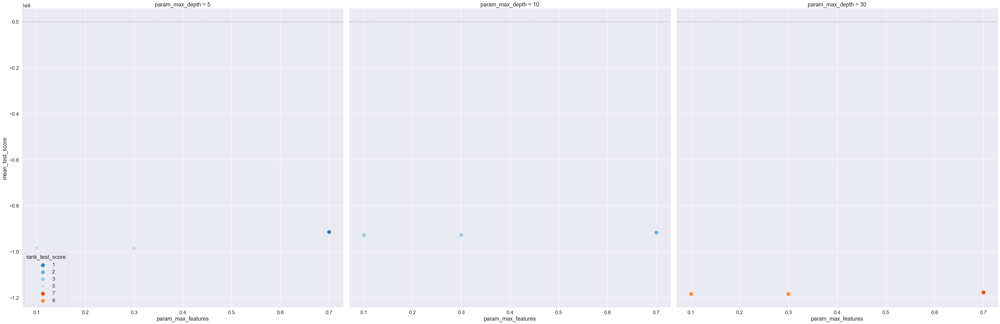

In [12]:
# Build a decision tree
# Set paramters for Grid Search CV
param_grid = {
    "max_depth": [5, 10, 30],
    "max_features": [0.1, 0.3, 0.7],
}
model = DecisionTreeRegressor(criterion="mse", random_state=0)

Tuned_Model = model_pipeline(model, param_grid, "neg_root_mean_squared_error")
plot_mean_scores(
    Tuned_Model,
    ["param_max_depth"],
    "param_max_features",
    "mean_test_score",
    "DecisionTree",
)

running model
609.453125 Seconds
finished running model


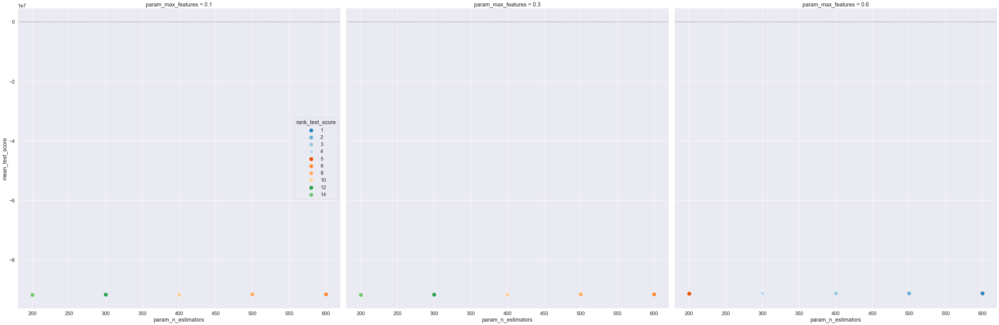

In [13]:
# Build a random forest
from sklearn.ensemble import RandomForestRegressor

# Set paramters for Grid Search
param_grid = {
    "n_estimators": [200, 300, 400, 500, 600],
    "max_features": [0.1, 0.3, 0.6],
}
# Initialise the random forest model
model2 = RandomForestRegressor(n_jobs=-1, random_state=0, bootstrap=True)

Tuned_Model2 = model_pipeline(model2, param_grid, "neg_root_mean_squared_error")
plot_mean_scores(
    Tuned_Model2,
    ["param_max_features"],
    "param_n_estimators",
    "mean_test_score",
    "RandomForest",
)

running model
4802.015625 Seconds
finished running model


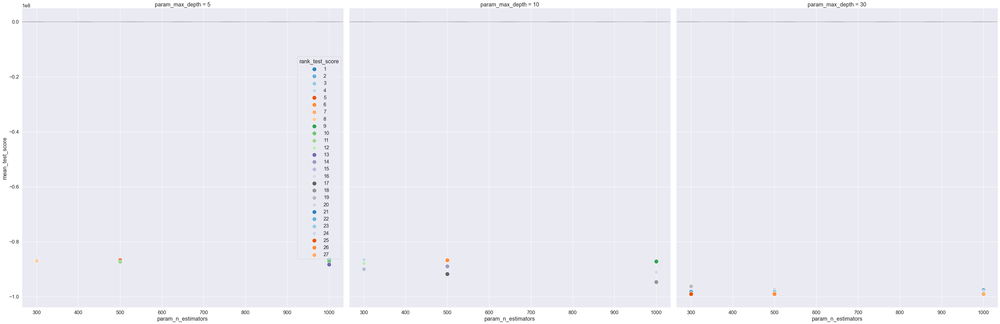

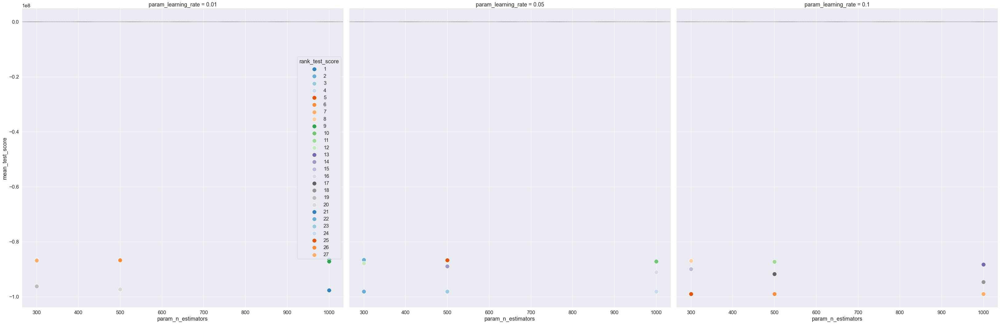

In [14]:
# Model 3: Gradient Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor

# Set paramters for Grid Search CV
param_grid = {
    "n_estimators": [300, 500, 1000],
    "max_depth": [5, 10, 30],
    "learning_rate": [0.01, 0.05, 0.1],
}
model3 = GradientBoostingRegressor(random_state=0, max_features="sqrt")

Tuned_Model3 = model_pipeline(model3, param_grid, "neg_root_mean_squared_error")
plot_mean_scores(
    Tuned_Model3,
    ["param_max_depth", "param_learning_rate"],
    "param_n_estimators",
    "mean_test_score",
    "GradientBoosting",
)

In [18]:
import joblib
from sklearn.ensemble import RandomForestClassifier

# model.save("DT.h5")
Tuned_Model3_done = Tuned_Model3
Tuned_Model3_done.save("GB.h5")

AttributeError: 'GridSearchCV' object has no attribute 'save'